# Network Clustering - Lab

## Introduction

In this lab you'll practice your clustering and visualization skills to investigate stackoverflow! Specifically, the dataset you'll be investigating examines tags on stackoverflow. With this, you should be able to explore some of the related technologies currently in use by developers.

## Objectives

In this lab you will: 

- Make visualizations of clusters and gain insights about how the clusters have formed

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import networkx as nx
import numpy as np

## Load the Dataset

Load the data from the `'stack-overflow-tag-network/stack_network_links.csv'` file. For now, simply load the file as a standard pandas DataFrame.

In [2]:
df = pd.read_csv('stack-overflow-tag-network/stack_network_links.csv')
df.head()

,source,target,value
0,azure,.net,20.933192
1,sql-server,.net,32.322524
2,asp.net,.net,48.407030
3,entity-framework,.net,24.370903
4,wpf,.net,32.350925


## Transform the Dataset into a Network Graph using NetworkX

Transform the dataset from a Pandas DataFrame into a NetworkX graph.

In [3]:
G = nx.Graph()
for row in df.index:
    G.add_edge(df.source[row], df.target[row], weight=df.value[row])

## Create an Initial Graph Visualization

Next, create an initial visualization of the network.

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


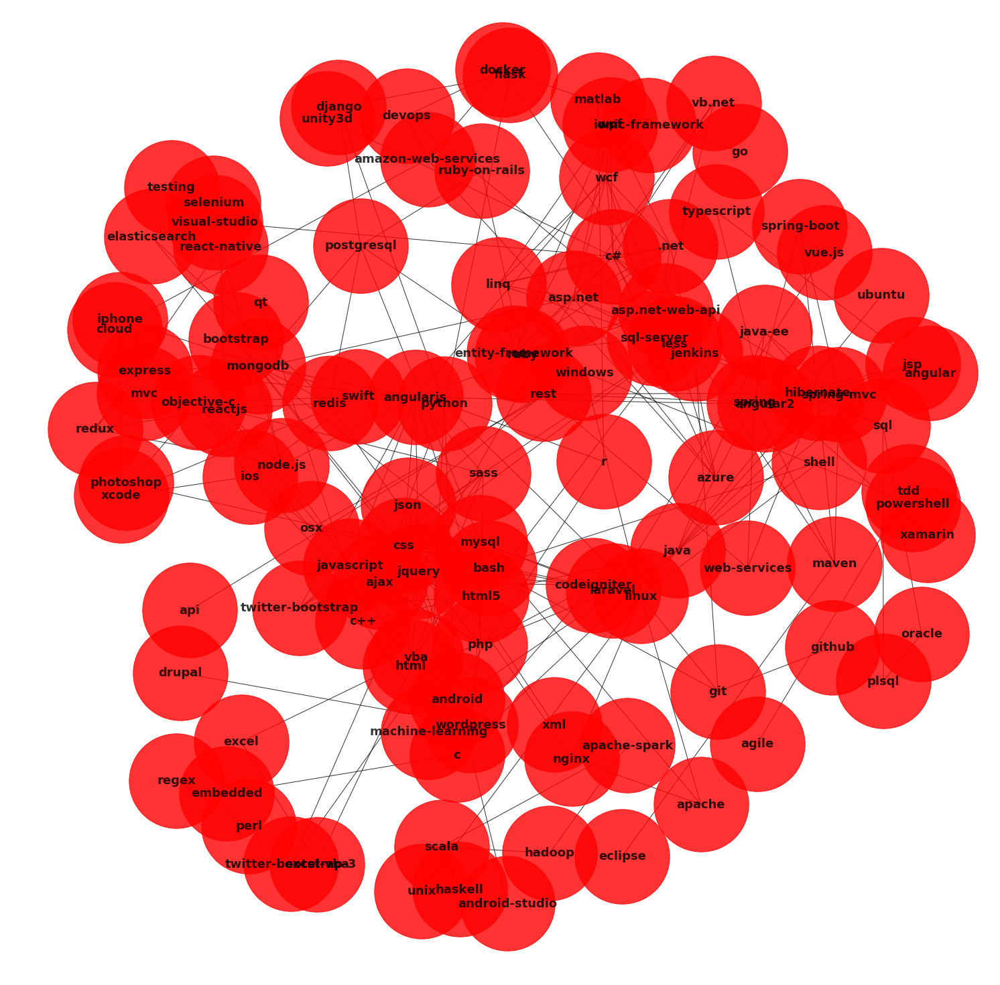

In [4]:
fig = plt.figure(figsize=(20,20))
nx.draw(G, pos=nx.spring_layout(G, k=2, seed=10), with_labels=True,
        alpha=.8, node_size=20000, font_weight='bold', font_size=18)

## Perform an Initial Clustering using k-clique Clustering

Begin to explore the impact of using different values of k.

In [5]:
for i in range(2,11):
    kc_clusters = list(nx.algorithms.community.k_clique_communities(G, k=i))
    print('With a k of {}, there are {} clusters'.format(i, len(kc_clusters)))

With a k of 2, there are 6 clusters
With a k of 3, there are 16 clusters
With a k of 4, there are 5 clusters
With a k of 5, there are 5 clusters
With a k of 6, there are 3 clusters
With a k of 7, there are 2 clusters
With a k of 8, there are 0 clusters
With a k of 9, there are 0 clusters
With a k of 10, there are 0 clusters


## Visualize The Clusters Produced from the K-Clique Algorithm

> **Level-Up:** Experiment with different `nx.draw()` settings. See the [draw documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html) for a full list. Some recommended settings that you've previewed include the position parameter `pos`, `with_labels=True`, `node_color`, `alpha`, `node_size`, `font_weight` and `font_size`. Note that `nx.spring_layout(G)` is particularly useful for laying out a well formed network. With this, you can pass in parameters for the relative edge distance via `k` and set a `random_seed` to have reproducible results as in `nx.spring_layout(G, k=2.66, seed=10)`. For more details, see the [spring_layout documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.layout.spring_layout.html?highlight=spring%20layout#networkx.drawing.layout.spring_layout).

In [6]:
colors = [('teal', '#1cf0c7'),
         ('workzone_yellow', '#ffd43d'),
         ('light-blue', '#00b3e6'),
         ('medium-blue', '#32cefe'),
         ('gray', '#efefef'),
         ('dark-blue', '#1443ff')]
color_dict = dict(colors)

fig = plt.figure(figsize=(35,20))
for n, ci in enumerate(kc_clusters):
    ci = G.subgraph(ci)
    nx.draw(ci, pos=nx.spring_layout(G, k=2, seed=10), with_labels=True, node_color=colors[n%len(colors)][1],
            alpha=0.8, node_size=20000, font_weight='bold', font_size=18),
plt.show()

<Figure size 2520x1440 with 0 Axes>

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


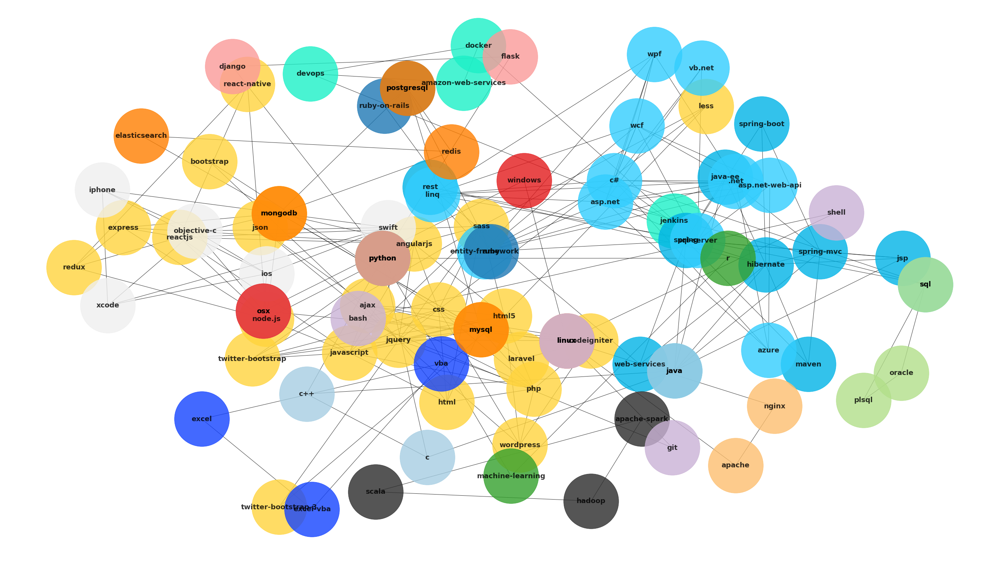

In [7]:
kc_clusters = list(nx.algorithms.community.k_clique_communities(G, k=3))
colors = ['#1cf0c7','#ffd43d','#00b3e6','#32cefe','#efefef','#2b2b2b', '#1443ff',
          '#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c',
          '#fdbf6f','#ff7f00','#cab2d6','#6a3d9a','#ffff99','#b15928']
fig = plt.figure(figsize=(35,20))
for n, ci in enumerate(kc_clusters):
    ci = G.subgraph(ci)
    nx.draw(ci, pos=nx.spring_layout(G, k=2.5, seed=10), with_labels=True, node_color=colors[n],
            alpha=0.8, node_size=20000, font_weight='bold', font_size=18)

## Perform an Alternative Clustering Using the Girvan-Newman Algorithm

Recluster the network using the Girvan-Newman algorithm. Remember that this will give you a list of cluster lists corresponding to the clusters that from removing the top $n$ edges according to some metric, typically edge betweenness.

In [8]:
c_gn = list(nx.algorithms.community.centrality.girvan_newman(G))
for n, clusters in enumerate(c_gn):
    print('After removing {} edges, there are {} clusters.'.format(n, len(clusters)))

After removing 0 edges, there are 7 clusters.
After removing 1 edges, there are 8 clusters.
After removing 2 edges, there are 9 clusters.
After removing 3 edges, there are 10 clusters.
After removing 4 edges, there are 11 clusters.
After removing 5 edges, there are 12 clusters.
After removing 6 edges, there are 13 clusters.
After removing 7 edges, there are 14 clusters.
After removing 8 edges, there are 15 clusters.
After removing 9 edges, there are 16 clusters.
After removing 10 edges, there are 17 clusters.
After removing 11 edges, there are 18 clusters.
After removing 12 edges, there are 19 clusters.
After removing 13 edges, there are 20 clusters.
After removing 14 edges, there are 21 clusters.
After removing 15 edges, there are 22 clusters.
After removing 16 edges, there are 23 clusters.
After removing 17 edges, there are 24 clusters.
After removing 18 edges, there are 25 clusters.
After removing 19 edges, there are 26 clusters.
After removing 20 edges, there are 27 clusters.
After

## Create a Visualization Wrapper

Now that you have an idea of how splintered the network becomes based on the number of edges removed, you'll want to examine some of the subsequent groups that gradually break apart. Since the network is quiet complex to start with, using subplots is not a great option; each subplot would be too small to accurately read. Create a visualization function `plot_girvan_newman(G, clusters)` which takes a NetworkX graph object as well as one of the clusters from the output of the Girvan-Newman algorithm above and plots the network with a unique color for each cluster.

> **Level-Up:** Experiment with different `nx.draw()` settings. See the [draw documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html) for a full list. Some recommended settings that you've previewed include the position parameter `pos`, `with_labels=True`, `node_color`, `alpha`, `node_size`, `font_weight` and `font_size`. Note that `nx.spring_layout(G)` is particularly useful for laying out a well formed network. With this, you can pass in parameters for the relative edge distance via `k` and set a `random_seed` to have reproducible results as in `nx.spring_layout(G, k=2.66, seed=10)`. For more details, see the [spring_layout documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.layout.spring_layout.html?highlight=spring%20layout#networkx.drawing.layout.spring_layout).

In [9]:
def plot_girvan_newman(G, clusters):
    fig = plt.figure(figsize=(35,20))
    colors = ['#1cf0c7','#ffd43d','#00b3e6','#32cefe','#efefef',
          '#1443ff','#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99',
          '#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a','#ffff99',
          '#b15928','#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3',
          '#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd','#ccebc5',
          '#ffed6f','#bf812d','#dfc27d','#f6e8c3','#f5f5f5','#c7eae5',
          '#80cdc1', '#35978f', '#01665e', '#003c30']
    for n , c in enumerate(clusters):
        ci = G.subgraph(c)
        # Other recommend random_seed choices are 3,7, 10, K value of 2.5 also seem to work well
        nx.draw(ci, pos=nx.spring_layout(G, k=2.66, seed=10), with_labels=True, node_color=colors[n],
                alpha=0.8, node_size=20000, font_weight='bold', font_size=20)
    plt.show()

## Visualize the Various Clusters that Form Throughout the Girvan-Newman Algorithm

Use your function to visualize the various clusters that form throughout the Girvan-Newman algorithm as you remove more and more edges from the network.

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


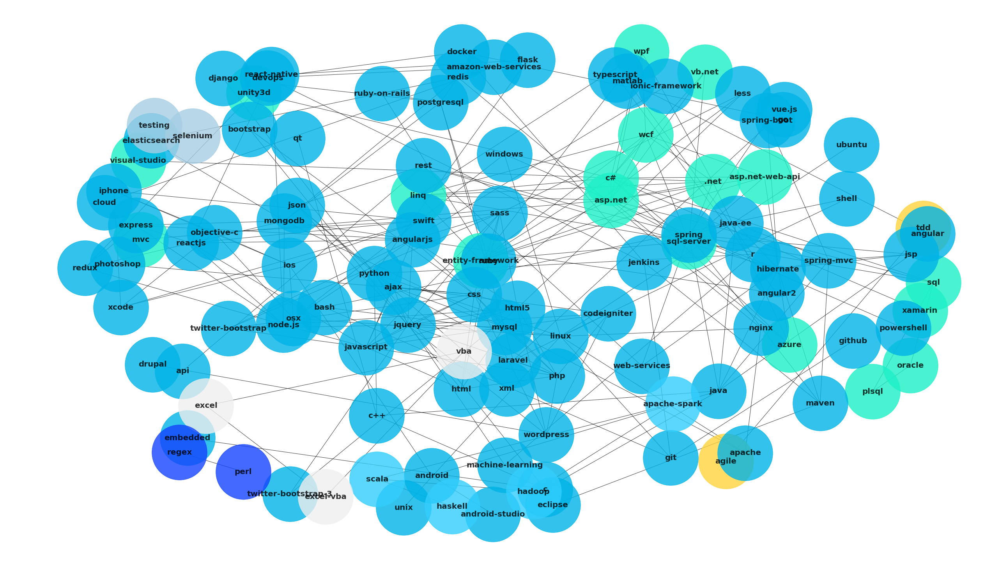

In [10]:
plot_girvan_newman(G, c_gn[0])

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


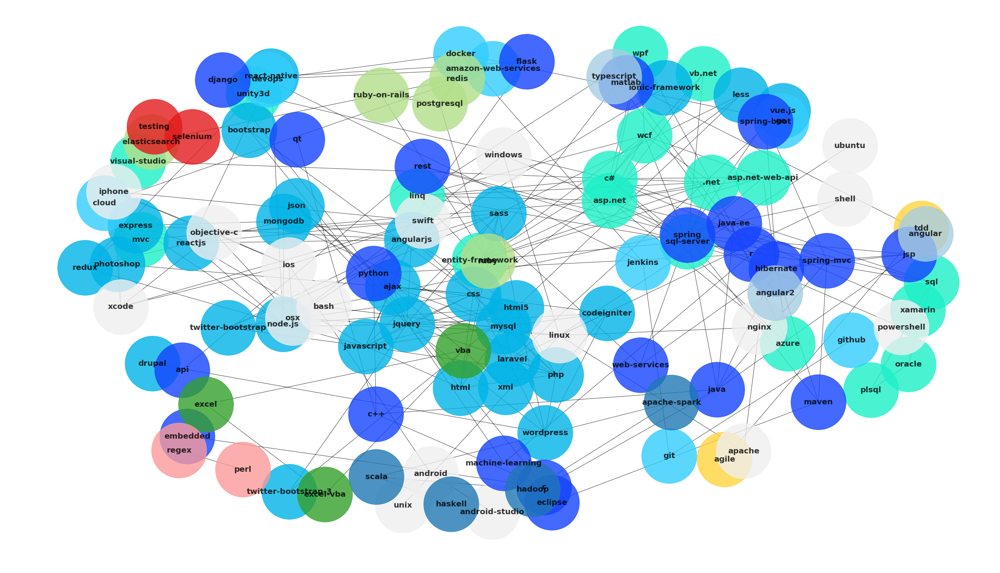

In [11]:
plot_girvan_newman(G, c_gn[5])

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


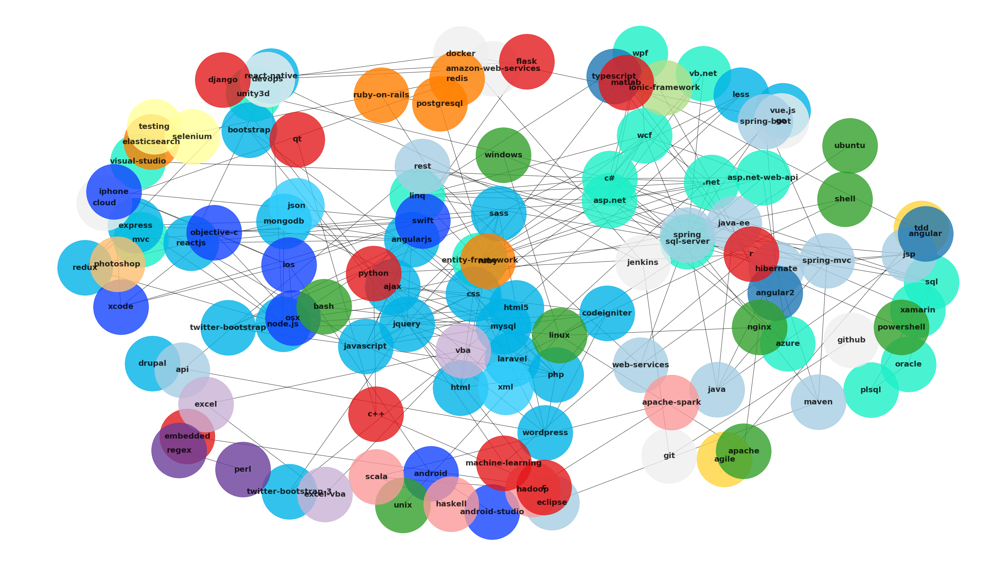

In [12]:
plot_girvan_newman(G, c_gn[10])

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


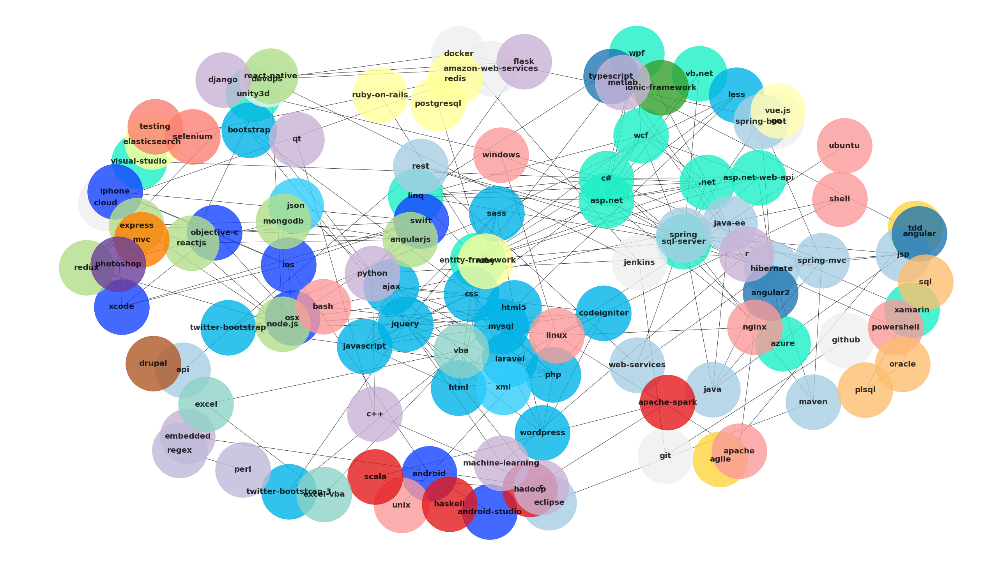

In [13]:
plot_girvan_newman(G, c_gn[15])

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


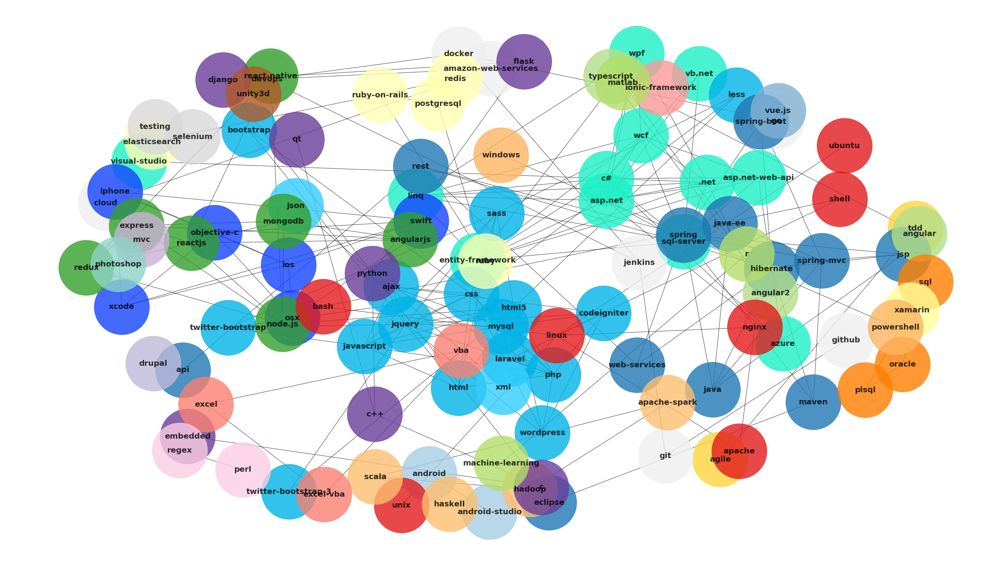

In [14]:
plot_girvan_newman(G, c_gn[20])

/Users/rlathbury/anaconda3/envs/learn-env/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


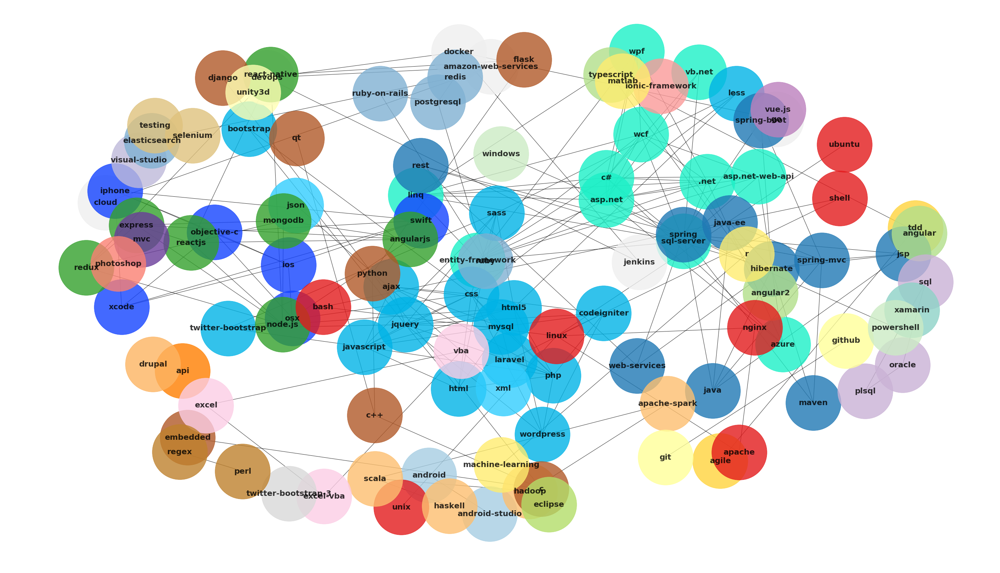

In [15]:
plot_girvan_newman(G, c_gn[25])

## Cluster Decay Rate

Create a visual to help yourself understand the rate at which clusters of this network formed versus the number of edges removed.

> **Level-Up**: Based on your graphic, what would you predict is an appropriate number of clusters? 

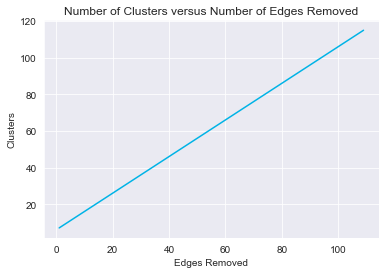

In [16]:
import seaborn as sns
sns.set_style('darkgrid')

y = [len(cluster) for cluster in c_gn]
x = [n+1 for n in range(len(c_gn))]
plt.plot(x,y, color='#00b3e6')
plt.title('Number of Clusters versus Number of Edges Removed')
plt.ylabel('Clusters')
plt.xlabel('Edges Removed')
plt.show()

Its hard to say what an appropriate number of clusters would be here.  The clusters seem to generate at a 1 for 1 ratio with removing edges, indicating that there is no sweet spot to stop removing edges.  The best bet might be to not remove edges at all.

## Choose a Clustering 

Now that you have generated various clusters within the overall network, which do you think is the most appropriate or informative?

I prefer the K-Clique Algorithym with k = 2.5 because it produced distinct clusters, but the clusters were not so small as to lose meaning.

## Summary

In this lab you practice using the k-clique and Girvan-Newman methods for clustering. Additionally, you may have also gotten a better sense of some of the current technological landscape. As you can start to see, network clustering provides you with powerful tools to further subset large networks into smaller constituencies allowing you to dig deeper into their particular characteristics.